In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn import decomposition
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import seaborn as sns
import time



/opt/anaconda3/envs/venv/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
#On importe la dataset
data_arn = pd.read_csv("data/Mtd-2_60prc__nbf-300_MinNbSeq-20_MaxNbSeq-30_MinLm-2_MaxLm-10.csv") 

## Consultation de la DataSet

In [3]:
data_arn

,index,seqIdInFam,familyId,AAAAAAAAAA,AAAAAAAAA,AAAAAAAAG,AAAAAAAAC,AAAAAAAA,AAAAAAAGA,AAAAAAAGG,...,CCCCCCCCG,CCCCCCCCC,CCCCCCCC,CCCCCCC,CCCCCC,CCCCC,CCCC,CCC,CC,Unnamed: 15191
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4,18,NaN
1,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4,18,NaN
2,2,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4,18,NaN
3,3,3,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4,16,NaN
4,4,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,5,19,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7291,7291,22,300,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,6,13,NaN
7292,7292,23,300,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,3,8,NaN
7293,7293,24,300,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,3,8,NaN
7294,7294,25,300,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,5,11,NaN


Dimention :7296 rows × 15192 columns

On supprime la colonne contenant des valeurs nulles et on renomme la classe 'target' des familles.

On supprime aussi l'index redondant ainsi que seqIdInFam puisqu’on n’a pas besoin de cette colonne.


In [4]:
data_arn=data_arn.rename(columns={"familyId": "Classe"})    
data_arn=data_arn.drop(['Unnamed: 15191','seqIdInFam','index'], axis=1)
#On change le type to int
data_arn=data_arn.astype(int)
data_arn_copy=data_arn.copy()

In [5]:
#on affiche les information correspondante à cette dataset
data_arn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7296 entries, 0 to 7295
Columns: 15189 entries, Classe to CC
dtypes: int64(15189)
memory usage: 845.5 MB


In [6]:
#Affichage des nombres, taux et types des valeurs manquantes par attribut
nb_m = data_arn.isnull().sum().sort_values()[50:]
ratio_m = (data_arn.isnull().sum()/data_arn.shape[0]).sort_values()[50:]
manquant = pd.concat([nb_m, ratio_m], axis=1, sort=False)
pd.DataFrame({'Types': data_arn[list(manquant.index.values)].dtypes,
                       'Nb manquants': nb_m,
                      'Ratio manquants%': ratio_m,})

,Types,Nb manquants,Ratio manquants%
GCCGCCCAGC,int64,0,0.0
GCCGCCCAG,int64,0,0.0
GCCGCCCA,int64,0,0.0
GCCGCCCGC,int64,0,0.0
GCCGCCCG,int64,0,0.0
...,...,...,...
ACCCCCCA,int64,0,0.0
ACCCCCCG,int64,0,0.0
ACCCCCCCA,int64,0,0.0
ACCCCCAGC,int64,0,0.0


Pas de données manquantes.
On affiche les statistiques.


In [7]:
data_arn.describe()

,Classe,AAAAAAAAAA,AAAAAAAAA,AAAAAAAAG,AAAAAAAAC,AAAAAAAA,AAAAAAAGA,AAAAAAAGG,AAAAAAAGC,AAAAAAAG,...,CCCCCCCCA,CCCCCCCCG,CCCCCCCCC,CCCCCCCC,CCCCCCC,CCCCCC,CCCCC,CCCC,CCC,CC
count,7296.000000,7296.000000,7296.00000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,...,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000,7296.000000
mean,149.585389,0.017407,0.03591,0.009731,0.006305,0.078810,0.003564,0.005482,0.003838,0.034814,...,0.003015,0.001645,0.008087,0.044819,0.157209,0.383772,0.928454,2.147067,5.331963,14.013569
std,87.277774,0.467562,0.57341,0.112489,0.085805,0.730392,0.061851,0.077469,0.064013,0.215619,...,0.061880,0.040525,0.164965,0.410009,0.891717,1.564226,2.622846,4.122976,6.710216,12.295971
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000
50%,149.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000
75%,225.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,7.000000,18.000000
max,300.000000,34.000000,37.00000,2.000000,2.000000,40.000000,2.000000,2.000000,2.000000,3.000000,...,2.000000,1.000000,8.000000,10.000000,14.000000,22.000000,29.000000,36.000000,54.000000,101.000000




En analysant les valeurs max mean et var, on constate que quelques motifs montrent qu'ils ont au moins des poids suivant des séquences.

On a Beaucoup de colonnes à analyser. Essayons de faire une réduction de dimension en  utilisant  PCA avec 10 composantes pour voir si cela va garder la quantité d'information.



In [8]:
data_arn_classe=data_arn["Classe"]
data_arn_motif=data_arn.drop(['Classe'], axis=1)

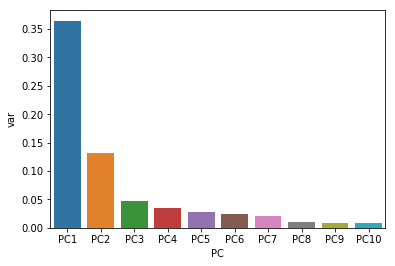

In [9]:
# Normaliser les valeurs
from sklearn.preprocessing import StandardScaler
pca = PCA(n_components = 10)
pca.fit(data_arn_motif)
X_pca = pca.transform(data_arn_motif)


data_pca = pd.DataFrame(data = X_pca , 
        columns = ['PC1', 'PC2','PC3','PC4','PC5', 'PC6','PC7','PC8','PC9', 'PC10'])

data_pca['Classe'] = data_arn_classe

var_pca = pd.DataFrame({'var': pca.explained_variance_ratio_,
             'PC':['PC1', 'PC2','PC3','PC4','PC5', 'PC6','PC7','PC8','PC9', 'PC10']})

var_pca 

sns.barplot(x='PC',y="var",  data=var_pca)


Essayon de visualiser les données suivant les deux premières composantes

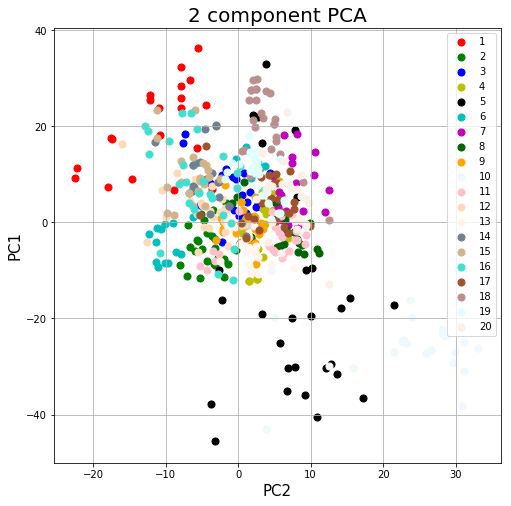

In [10]:
#plot data reduite par l'acp
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('PC2', fontsize = 15)
ax.set_ylabel('PC1', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [1, 2, 3, 4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
colors = ['r', 'g', 'b','y','k','c','m','darkgreen','orange','#F0F8FF','#FFC0CB','#FFDAB9','#FFF5EE','#708090','#D2B48C','#40E0D0','#A0522D','#BC8F8F','#E0FFFF','#FAF0E6']
for target, color in zip(targets,colors):
    indicesToKeep = data_pca['Classe'] == target
    ax.scatter(data_pca.loc[indicesToKeep, 'PC3']
               , data_pca.loc[indicesToKeep, 'PC2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()



On constate que seule la première composante contient la plus grande partie d'informations.

Pour la visualisation les données ne semblent pas du tout séparées.

On va essayer de réappliquer PCA avec deux composantes. Ainsi On va tester quelques méthodes de classifications pour voir si on est capable de classifier ARN uniquement avec deux composantes (après une réduction de dimension).


In [11]:
#appliquer l'acp
x=data_arn_motif
y=data_arn_classe
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PC1', 'PC2'])
finalpca = pd.concat([principalDf, y], axis = 1)

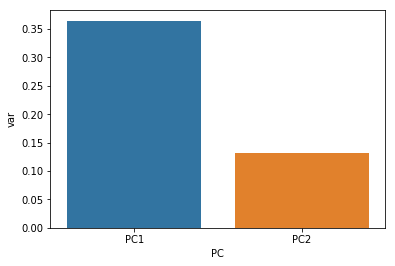

In [12]:

finalpca['Classe'] = data_arn_classe

var_pca = pd.DataFrame({'var': pca.explained_variance_ratio_,
             'PC':['PC1', 'PC2']})

var_pca 

sns.barplot(x='PC',y="var",  data=var_pca)

On visualise 20 familles suivant ces deux axes.

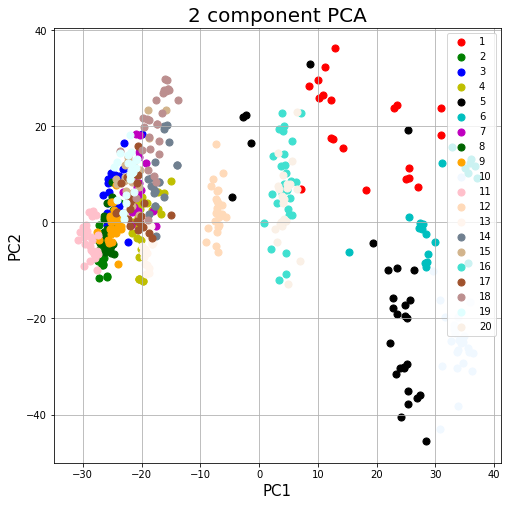

In [13]:
#plot data reduite par l'acp
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('PC1', fontsize = 15)
ax.set_ylabel('PC2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [1, 2, 3, 4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
colors = ['r', 'g', 'b','y','k','c','m','darkgreen','orange','#F0F8FF','#FFC0CB','#FFDAB9','#FFF5EE','#708090','#D2B48C','#40E0D0','#A0522D','#BC8F8F','#E0FFFF','#FAF0E6']
for target, color in zip(targets,colors):
    indicesToKeep = finalpca['Classe'] == target
    ax.scatter(finalpca.loc[indicesToKeep, 'PC1']
               , finalpca.loc[indicesToKeep, 'PC2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()


On constate bien que les familles sont généralement séparées avec quelques chevauchements à cause de la réduction de dimension.

Une famille semble bien écartée des autres.

Les données sont bien séparées dans leur dimension. Pour les prouver  on visualise selon d'autres composantes.

On va essayer ensuite  d'appliquer quelques modèles de classification pour tester la validité de la méthode pca.

In [14]:
finalpca_motif=finalpca.drop(['Classe'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(finalpca_motif, finalpca['Classe'], test_size=0.2)

In [2]:
from sklearn import model_selection
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import precision_recall_fscore_support

Avant de donner les résultats On va, vous montrer que l'ACP a bien marché lorsque la dataset était de petite taille (environs 20 familles).


L’augmentation des données à 3000 familles avec un nombre minimal de motif rend l'acp inefficace.


In [39]:
data_arn_test = pd.read_csv("data/20_family_v2_matrix_motifs_seqIds.csv") 


In [40]:
data_arn_test=data_arn_test.rename(columns={"familyId": "Classe"})
data_arn_test=data_arn_test.drop(['seqIdInFam', 'Unnamed: 101119','index'], axis=1)

In [41]:
x=data_arn_test.drop(['Classe'], axis=1)
y=data_arn_test['Classe']
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponentss = pca.fit_transform(x)
principalDff = pd.DataFrame(data = principalComponentss
            , columns = ['principal component 1', 'principal component 2'])
finalDff = pd.concat([principalDff, y], axis = 1)
finalDff_train=finalDff.drop(['Classe'], axis=1)


On a chargé la base donnée de test (20 famille) qu'on a déjà utilisé, puis on a appliqué pca.

On va tester quelques modèles.

/opt/anaconda3/envs/venv/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


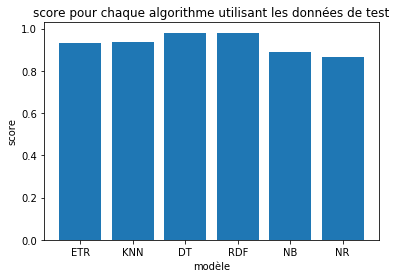

Temps d'execution : 1.6448960304260254 secondes ---


In [42]:
start_time = time.time()

score_test=[]
noms_test = []
classifi_test=[]
classifi_test.append(('ETR',ExtraTreesClassifier(n_estimators=10, criterion='gini', max_depth=10)))
classifi_test.append(('KNN', KNeighborsClassifier()))
classifi_test.append(('DT', DecisionTreeClassifier(max_depth=10)))
classifi_test.append(('RDF',RandomForestClassifier(max_depth=10, n_estimators=10, n_jobs=-1)))
classifi_test.append(('NB', GaussianNB()))
classifi_test.append(('NR',MLPClassifier(alpha=0.0001)))
for n, model in classifi_test:
    model.fit(finalDff_train, finalDff['Classe'])
    score_test.append(model.score(finalDff_train, finalDff['Classe']))
    noms_test.append(n)
plt.bar(noms_test, score_test)
plt.xlabel('modèle')
plt.ylabel('score')
plt.title('score pour chaque algorithme utilisant les données de test')
plt.show()
print("Temps d'execution : %s secondes ---" % (time.time() - start_time))


In [43]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display                               
from ipywidgets import interactive
start_time = time.time()

X = finalDff_train
y = finalDff['Classe']

def plot_tree(crit, split, depth, min_split, min_leaf=0.2):
    estimator = DecisionTreeClassifier(random_state = 0 
      , criterion = crit
      , splitter = split
      , max_depth = depth
      , min_samples_split=min_split
      , min_samples_leaf=min_leaf)
    estimator.fit(X, y)
    graph = Source(tree.export_graphviz(estimator
      , out_file=None
      , class_names=['1', '2', '3', '4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20']
      , filled = True))
   
    display(SVG(graph.pipe(format='svg')))
    return estimator
inter=interactive(plot_tree 
   , crit = ["entropy","gini"]
   , split = ["best", "random"]
   , depth=[40,20,10,4,2]
   , min_split=(0.00001,0.1,1)
   , min_leaf=(0.000001,0.1,0.5))
print("Temps d execution : %s secondes ---" % (time.time() - start_time))
display(inter)

Temps d execution : 0.04891538619995117 secondes ---


interactive(children=(Dropdown(description='crit', options=('entropy', 'gini'), value='entropy'), Dropdown(des…


Pour la visualisation correcte de l'arbre de décision  à 20 familles, on  augmente le depth à 40 puis on diminue le min_leaf à 0.


Les résultats sont presque parfaits. Nous avons même utilisé les données de test et on est arrivé à un score presque parfait.


### Pour une visualisation simple de forme voir ci-dessous

In [21]:
from sklearn import tree
clf = tree.DecisionTreeClassifier(max_depth = 10)
clf = clf.fit(X, y)
tree.plot_tree(clf.fit(X,y))
fig = plt.gcf()
fig.set_size_inches(1, 1)

Là on arrive à deux contraintes:
    
1-L'utilisation du pca marche bien avec les données de 20 familles mais on ne sait rien pour le nombre total de familles. Généralement le score va diminuer.

2- même si on suppose qu'on aura un bon résultat ainsi qu’un bon score pour les données totales avec pca. Cela nous pose un problème. En effet  on perd l'information sur les motifs génères dans la matrice des données.

Donc l'utilisation de PCA est à évité.

On prouve l'inefficacité de pca pour les données totales et même le temps d'exécution est beaucoup plus grand.

In [22]:
start_time = time.time()

score_=[]
noms_ = []
classifi=[]
classifi.append(('KNN', KNeighborsClassifier()))
classifi.append(('DT', DecisionTreeClassifier(max_depth=10)))
classifi.append(('RDF',RandomForestClassifier(max_depth=10, n_estimators=10, n_jobs=-1)))
for n, model in classifi:
    model.fit(finalpca_motif, finalpca['Classe'])
    score_.append(model.score(finalpca_motif, finalpca['Classe']))
    noms_.append(n)
plt.bar(noms_, score_)
plt.xlabel('modèle')
plt.ylabel('score')
plt.title('score pour chaque algorithme utilisant les données globales')
plt.show()
print("Temps d'execution : %s secondes ---" % (time.time() - start_time))


On a bien prouvé l'inefficacité de Pca pour l'ensemble global des données avec un Score faible.

## Selection et suppression d'attributs innutiles


Si on utilise la base de données globale, le nombre de motifs est très grand, mais l'utilité de chaque motif dans la dataset n'est pas la même.

Donc, on va essayer de ne garder que les motifs qui ont un poids et qui sont représentatifs pour le cluster ainsi que pour la dataset.


On a essayé plusieurs méthodes existantes dans sklearn à savoir features selection avec le parametre pourcentage. Mais le problême posé c’est qu'on ne sait pas vraiment ce qu'on veut réduire et à quel  pourcentage au risque de perdre l'information ou de supprimer les motif intéressants.


D'où, on a essayé d'implémenter un algorithme pour la réduction de dimension et de ne garder que les motifs représentatifs pour les clusters et la dataset.

Suivons les étapes :


1-On calcul le nombre d'occurrences de chaque motifs dans la base de données globale.

In [23]:
count_data_all=pd.DataFrame(data_arn_motif.astype(bool).sum(axis=0).sort_values(),columns=['nb_count_all'])
count_data_all


,nb_count_all
ACACAGCCC,12
GCAGCGAGGC,12
GAGGACGC,12
CAAACCCCC,12
AGGCGCAGG,12
...,...
GC,7265
CA,7268
AC,7290
GA,7294


On calcul le nombre de motifs suivant chaque famille.

In [24]:
classes=data_arn['Classe'].unique()
data_result=[]
for k in classes:
    
    Cs=data_arn_motif[data_arn['Classe']==int(k)]
    df_cluster=pd.DataFrame(Cs.astype(bool).sum(axis=0).sort_values(),columns=['nb_count_cluster'])
    df_cluster['num_classe']=k
    data_result.append(df_cluster)
count_data_cluster = pd.concat(data_result)
count_data_cluster

,nb_count_cluster,num_classe
AAAAAAAAAA,0,0
GCCAAGGGG,0,0
GCCAAGGG,0,0
GCCAAGGCA,0,0
GCCAAGGCCA,0,0
...,...,...
CCCGG,27,300
CCGG,27,300
CA,27,300
AG,27,300


On ajoute le nombre d'occurence total à la deuxièmme table sous le nom d'OCC ainsi que le nombre total (count) de motif(nombr_motif).

In [25]:
data_result=[]
for k in classes:
    
    Cs=data_arn_motif[data_arn['Classe']==int(k)]
    df=pd.DataFrame(Cs.astype(bool).sum(axis=0).sort_values(),columns=['nb_count'])
    df['num_classe']=k
    df['nombr_motif']=len(df)
    df['OCC']=count_data_all['nb_count_all']
    data_result.append(df)
final_data_result = pd.concat(data_result)
final_data_result

,nb_count,num_classe,nombr_classe,OCC
AAAAAAAAAA,0,0,15188,33
GCCAAGGGG,0,0,15188,35
GCCAAGGG,0,0,15188,84
GCCAAGGCA,0,0,15188,30
GCCAAGGCCA,0,0,15188,17
...,...,...,...,...
CCCGG,27,300,15188,1978
CCGG,27,300,15188,4039
CA,27,300,15188,7268
AG,27,300,15188,7296


On calcul WGF et WLF (la description existe dans le rapport).

In [26]:
n=len(data_arn)
final_data_result['OCCs3'] = np.power((final_data_result['nb_count']),3)
final_data_result['Z']=n-final_data_result['OCC']+1
final_data_result['first_s']=final_data_result['Z']*final_data_result['OCCs3']
final_data_result['WGF']=(final_data_result['OCC']/n)*final_data_result['Z']
final_data_result['WLF']=(final_data_result['nb_count']**2)/(final_data_result['OCC']*final_data_result['nombr_motif'])


final_data_result


,nb_count,num_classe,nombr_classe,OCC,OCCs3,Z,first_s,WGF,WLF
AAAAAAAAAA,0,0,15188,33,0,7264,0,32.855263,0.000000
GCCAAGGGG,0,0,15188,35,0,7262,0,34.836897,0.000000
GCCAAGGG,0,0,15188,84,0,7213,0,83.044408,0.000000
GCCAAGGCA,0,0,15188,30,0,7267,0,29.880757,0.000000
GCCAAGGCCA,0,0,15188,17,0,7280,0,16.962719,0.000000
...,...,...,...,...,...,...,...,...,...
CCCGG,27,300,15188,1978,19683,5319,104693877,1442.020559,0.000024
CCGG,27,300,15188,4039,19683,3258,64127214,1803.599507,0.000012
CA,27,300,15188,7268,19683,29,570807,28.888706,0.000007
AG,27,300,15188,7296,19683,1,19683,1.000000,0.000007


On definit un seuil pour supprimer les motifs non significatifs.

In [27]:
final_data_result_=final_data_result[final_data_result['WGF']>30]
final_data_result_new=final_data_result_[final_data_result_['WLF']>1e-05]
final_data_result_new

,nb_count,num_classe,nombr_classe,OCC,OCCs3,Z,first_s,WGF,WLF
ACGAAAGC,3,0,15188,44,27,7253,195831,43.740680,0.000013
ACGAGGCA,3,0,15188,31,27,7266,196182,30.872533,0.000019
CAAACCGA,3,0,15188,56,27,7241,195507,55.577851,0.000011
CAAGCCGG,3,0,15188,50,27,7247,195669,49.664200,0.000012
AGACCACG,3,0,15188,32,27,7265,196155,31.864035,0.000019
...,...,...,...,...,...,...,...,...,...
GACC,27,300,15188,3720,19683,3577,70406091,1823.799342,0.000013
GGCCG,27,300,15188,1866,19683,5431,106898373,1389.013980,0.000026
GACCC,27,300,15188,1685,19683,5612,110460996,1296.082785,0.000028
CCCGG,27,300,15188,1978,19683,5319,104693877,1442.020559,0.000024


In [28]:
list_ind=final_data_result_new.index
final_index = final_data_result_new.loc[~final_data_result_new.index.duplicated(keep='first')]
final_indexes=final_index.index
data_new_arn=data_arn[final_indexes]
data_new_arn=pd.concat([data_new_arn, data_arn['Classe']], axis=1)

On voit bien que les motifs supprimés sont ceux qui existent dans toutes les familles car ils ne sont pas représentatifs. Ils représentent les motifs avec 2 caractères.

Ainsi que  les plus grands motifs rares qui représentent juste quelques séquences et non les clusters


## Gérer les données imbalancer

On va essayer de supprimer tout les familles avec moin de 20 séquences.
Car ces familles vont servir à rien puisqu'on a pas des données d'entrainnement suffisant.


In [29]:
data_new_arn
data_new_arn.groupby('Classe').count().sort_values(['CAAACCGA'], ascending=False)

,ACGAAAGC,ACGAGGCA,CAAACCGA,CAAGCCGG,AGACCACG,AGACACCC,AAGCCGGA,CGAGACAC,GAGCGAGA,AACGAGGC,...,GCAACGGCA,AAGCAACG,GGAAAGCCA,ACGGCCGG,CCAAAGGGA,CAACAGGA,ACCGGGCC,CCGAACAC,GCACGCGA,GACAAACC
Classe,,,,,,,,,,,,,,,,,,,,,
150,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
61,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
223,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
201,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
188,30,30,30,30,30,30,30,30,30,30,...,30,30,30,30,30,30,30,30,30,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
53,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20
137,20,20,20,20,20,20,20,20,20,20,...,20,20,20,20,20,20,20,20,20,20


J'ai choisi la valeur 19 comme valeurs de séquence minimal.

In [30]:
freq_d=data_new_arn.Classe.value_counts().gt(19)
data=data_new_arn.loc[data_new_arn.Classe.isin(freq_d[freq_d].index)]
data

,ACGAAAGC,ACGAGGCA,CAAACCGA,CAAGCCGG,AGACCACG,AGACACCC,AAGCCGGA,CGAGACAC,GAGCGAGA,AACGAGGC,...,AAGCAACG,GGAAAGCCA,ACGGCCGG,CCAAAGGGA,CAACAGGA,ACCGGGCC,CCGAACAC,GCACGCGA,GACAAACC,Classe
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7291,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,300
7292,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,300
7293,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,300
7294,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,300


In [31]:
data_classe=data['Classe']
data_motif=data.drop(['Classe'],axis=1)

Malgré cette modification les données sont encore Im balancées, ce qu’on va traiter dans les phases d'apprentissages.

## Choix des modèles les plus performent pour notre dataset.

On va faire une comparaison entre plusieurs modèles de classification puis on selectionne les meilleurs modèls.

In [66]:
X_train, X_test, y_train, y_test = train_test_split(data_motif, data_classe, test_size=0.3)


In [33]:
#from sklearn.metrics import f1_score, make_scorer


# Custom scorer for cross validation
#scorer = make_scorer(f1_score, greater_is_better=True, average = 'macro')

Une cross validation de 10 est appliqué avec chaque modèle et on retourne la moyenne ainsi que l'ecartype des scores obtenus de cette cross validation.

In [34]:
import warnings 
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import cross_val_score

# Filter out warnings from models
warnings.filterwarnings('ignore', category = ConvergenceWarning)
warnings.filterwarnings('ignore', category = DeprecationWarning)
warnings.filterwarnings('ignore', category = UserWarning)

# Dataframe to hold results
model_results = pd.DataFrame(columns = ['model', 'cv_mean', 'cv_std'])

def cv_model(train, train_labels, model, name, model_results=None):
    """Perform 10 fold cross validation of a model"""
    
    cv_scores = cross_val_score(model, train, train_labels, cv = 10, scoring='accuracy', n_jobs = -1)
    print(f'10 Fold CV Score: {round(cv_scores.mean(), 5)} with std: {round(cv_scores.std(), 5)}')
    
    if model_results is not None:
        model_results = model_results.append(pd.DataFrame({'model': name, 
                                                           'cv_mean': cv_scores.mean(), 
                                                            'cv_std': cv_scores.std()},
                                                           index = [0]),
                                             ignore_index = True)
        
        return model_results

GaussienNB modèle score.

In [35]:
model_results = cv_model(X_train, y_train, 
                         GaussianNB(), 'GNB', model_results)

10 Fold CV Score: 0.65812 with std: 0.02063


MLPClassifier modèle score.

In [36]:
model_results = cv_model(X_train, y_train, 
                         MLPClassifier(hidden_layer_sizes=(32, 64, 128, 64, 32)),
                         'MLP', model_results)

10 Fold CV Score: 0.74721 with std: 0.02437


KNeighborsClassifier modèle score avec k= 5, 10,20 car la variation k de ce modèle est trés sensible au score de notre dataset.

In [37]:
for n in [5, 10, 20]:
    print(f'\nKNN with {n} neighbors\n')
    model_results = cv_model(X_train, y_train, 
                             KNeighborsClassifier(n_neighbors = n),
                             f'knn-{n}', model_results)


KNN with 5 neighbors

10 Fold CV Score: 0.78677 with std: 0.01989

KNN with 10 neighbors

10 Fold CV Score: 0.72097 with std: 0.01792

KNN with 20 neighbors

10 Fold CV Score: 0.57882 with std: 0.01743


ExtraTreesClassifier modèle score.

In [38]:
from sklearn.ensemble import ExtraTreesClassifier

model_results = cv_model(X_train, y_train, 
                         ExtraTreesClassifier(n_estimators = 100, random_state = 10),
                         'EXT', model_results)

10 Fold CV Score: 0.91286 with std: 0.0116


RandomForestClassifier modèle score.

In [39]:
model_results = cv_model(X_train, y_train,
                          RandomForestClassifier(100, random_state=10),
                              'RF', model_results)

10 Fold CV Score: 0.90875 with std: 0.01359


On visualise les resultats moyennes de chaque modèle avec l'ecartype obtenue.

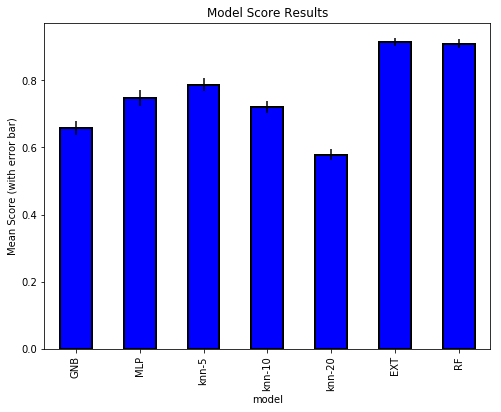

In [40]:
model_results.set_index('model', inplace = True)
model_results['cv_mean'].plot.bar(color = 'blue', figsize = (8, 6),
                                  yerr = list(model_results['cv_std']),
                                  edgecolor = 'k', linewidth = 2)
plt.title('Model Score Results');
plt.ylabel('Mean Score (with error bar)');
model_results.reset_index(inplace = True)

On constate que les modèles extra-tree et random forest donnent un meilleur résultat.Or pour kNeighbors, Peut être en ajustant le k, il peut donner un meilleur résultat, car les petites valeurs de k donnent un bon score.

# CHOIX DE PARAMETRES

Notre choix de paramètres pour les trois  modèles choisis KNN EXT et RDF va se faire à l'aide de cross validation (avec des données de validation).

Une fois qu’on a choisi les bons paramètres, on va refaire l'entrainement des modèles avec ces paramètres.

On va comparer ces paramètres en utilisant le maximum score et la variance de ce score en utilisant un cross validation.

La recherche d'hyper-paramètre pour Kneighbors se fait manuellement.

La recherche d'hyper-paramètre pour extra-tree et random-forest se fait à l'aide de gride-search


In [41]:
from sklearn.model_selection import StratifiedKFold    
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

X, X_test, y, y_test = train_test_split(np.asarray(data_motif), np.asarray(data_classe), test_size = 0.3, random_state=0)

In [42]:
skf = StratifiedKFold(n_splits=5,random_state=None)
skf.get_n_splits(X,y)
optimal_k = 1
optimal_score = 0
k_possible=[2,6,10]
for k in k_possible :
    i = 0
    train_score = 0
    validate_score = 0
    for train_index, validate_index in skf.split(X, y):
        X_train, X_validate = X[train_index], X[validate_index]
        y_train, y_validate = y[train_index], y[validate_index]
        knc = KNeighborsClassifier(n_neighbors=k)
 
        knc.fit(X_train, y_train)
        pred_train = knc.predict(X_train)
        pred_validate = knc.predict(X_validate)
        t_score, v_score = accuracy_score(y_train,pred_train),accuracy_score(y_validate,pred_validate)
        #print("Iteration", i, ": train score", t_score, "; validate score", v_score)
        train_score += t_score
        validate_score += v_score
        i+=1
    train_score = train_score/i
    validate_score = validate_score/i
    print("N_neighbors=",k,";Mean train score", train_score, "; Mean validate score", validate_score)
    if(validate_score>optimal_score):
        optimal_k =k
        optimal_score = validate_score

N_neighbors= 2 ;Mean train score 0.9318092588298941 ; Mean validate score 0.821029227705465
N_neighbors= 6 ;Mean train score 0.8197572629110598 ; Mean validate score 0.755824169926648
N_neighbors= 10 ;Mean train score 0.7491186252007781 ; Mean validate score 0.6998234722491093


Meilleur parametre  k est : 2

On s'assure du score de test

In [43]:
optimal_k = 2

knc = KNeighborsClassifier(n_neighbors=optimal_k)
knc.fit(X,y)
pred_train = knc.predict(X)
pred_test = knc.predict(X_test)
train_score, test_score = accuracy_score(y,pred_train),accuracy_score(y_test,pred_test)
print("N_neighbors=",optimal_k,";Train score", train_score, "; Test score", test_score)

N_neighbors= 2 ;Train score 0.9398864303896612 ; Test score 0.8332571950662403


Bon score.

Maintenant on effectue le gride search pour les 2 autres modèles.

In [44]:
from sklearn.model_selection import GridSearchCV


rfc = RandomForestClassifier(n_jobs=-1,max_depth=100,max_features= 'sqrt' ,n_estimators=50, oob_score = True) 

param_grid = { 
    'max_depth': [50,100,150],
    'n_estimators': [50,200, 700],
    'max_features': ['log2']#regardant le temps de calcul de ce gridsearch on a laisser que log2 apres une excution 
                            #puisque c'est le meilleure parametre aubtenu
}

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(X, y)
print(CV_rfc.best_params_)

{'max_depth': 150, 'max_features': 'log2', 'n_estimators': 700}


Meilleures parametres :max_depth': 150, 'n_estimators': 700

On affiche le meilleure score.

In [45]:
resultat_score_rfc = CV_rfc.best_score_
print(resultat_score_rfc)

0.9537897882241999


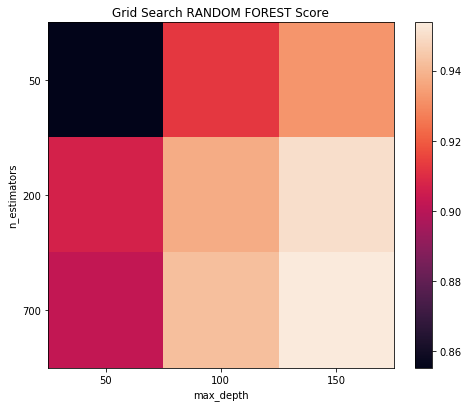

In [46]:
n_estimators=[50,200, 700]
max_depth=[50,100,150]
scores = CV_rfc.cv_results_['mean_test_score'].reshape(len(n_estimators),len(max_depth))
plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest',cmap='rocket')
plt.xlabel('max_depth')
plt.ylabel('n_estimators')
plt.colorbar()
plt.xticks(np.arange(len(max_depth)), max_depth)
plt.yticks(np.arange(len(n_estimators)), n_estimators)
plt.title('Grid Search RANDOM FOREST Score')
plt.show()

La recherche de la grille montre bien que les paramètres :max_depth': 150, 'n_estimators': 700 ont eu le meilleur score.

In [47]:

etc = ExtraTreesClassifier(n_jobs=-1,max_depth=100 ,bootstrap=True,n_estimators=50, oob_score = True) 

param_grid = { 
    'max_depth': [50,100,150],
    'n_estimators': [50,200, 700],
    'max_features': ['log2']#regardant le temps de calcul de ce gridsearch on a laisser que log2 apres une excution 
                            #puisque c'est le meilleure parametre aubtenu
}

CV_etc = GridSearchCV(estimator=etc, param_grid=param_grid, cv= 5)
CV_etc.fit(X, y)
print(CV_etc.best_params_)

{'max_depth': 150, 'max_features': 'log2', 'n_estimators': 700}


In [48]:
resultat_scor_etc = CV_etc.best_score_
print(resultat_scor_etc)

0.9481094663725177


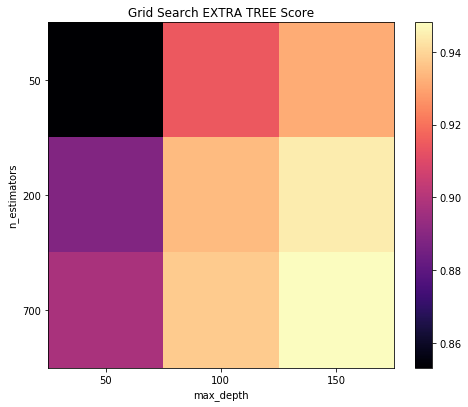

In [49]:
n_estimators=[50,200, 700]
max_depth=[50,100,150]
scores = CV_etc.cv_results_['mean_test_score'].reshape(len(n_estimators),len(max_depth))
plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(scores, interpolation='nearest',cmap='magma')
plt.xlabel('max_depth')
plt.ylabel('n_estimators')
plt.colorbar()
plt.xticks(np.arange(len(max_depth)), max_depth)
plt.yticks(np.arange(len(n_estimators)), n_estimators)
plt.title('Grid Search EXTRA TREE Score')
plt.show()

De même que pour extra tree les paramètres :max_depth': 150, 'n_estimators': 700 ont eu le meilleur score. Des fois avec n_est trop élevé, on risque d'avoir sur-apprentissage mais à cause de la taille de la base de donnée, on peut éviter ce problème.(On va prouver cela après)

#### On a choisi les meilleurs modèles.

#### On a fait le choix des meilleurs paramètres.

#### Maintenant on va comparer et choisir un seul modèle.


## Variance des scores des modèles

On définit une méthode qui utilise une cross validation. Elle retourne une dataframe avec le moyen score pour chaque modèle ainsi que son std..

Maintenant en utilisant les meilleurs hyperparametres.

In [34]:
from sklearn.model_selection import cross_val_score
X_train, X_test, y_train, y_test = train_test_split(data_motif, data_classe, test_size=0.3)


last_model_results_ = pd.DataFrame(columns = ['model', 'cv_mean', 'cv_std'])

def cv_model(train, train_labels, model, name, last_model_results_=None):
    """Perform 10 fold cross validation of a model"""
    
    cv_scoress = cross_val_score(model, train, train_labels, cv = 10, scoring='accuracy', n_jobs = -1)
    print(f'10 Fold CV Score: {round(cv_scoress.mean(), 5)} with std: {round(cv_scoress.std(), 5)}')
    
    if last_model_results_ is not None:
        last_model_results_ = last_model_results_.append(pd.DataFrame({'model': name, 
                                                           'cv_mean': cv_scoress.mean(), 
                                                            'cv_std': cv_scoress.std()},
                                                           index = [0]),
                                             ignore_index = True)
        
        return last_model_results_

In [35]:
last_model_results_ = cv_model(X_train, y_train, 
                         ExtraTreesClassifier(max_depth=150,n_estimators = 700, random_state = 10),
                         'EXT', last_model_results_)

/opt/anaconda3/envs/venv/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


10 Fold CV Score: 0.88663 with std: 0.01281


In [36]:
last_model_results_ = cv_model(X_train, y_train, 
                             KNeighborsClassifier(n_neighbors = 2),
                             'knn-2', last_model_results_)

/opt/anaconda3/envs/venv/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


10 Fold CV Score: 0.83416 with std: 0.01671


In [37]:
last_model_results_ = cv_model(X_train, y_train,
                          RandomForestClassifier(max_depth=150,n_estimators = 700, random_state=10),
                              'RF', last_model_results_)

/opt/anaconda3/envs/venv/lib/python3.7/site-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 9 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


10 Fold CV Score: 0.88291 with std: 0.01036


In [38]:
last_model_results_

,model,cv_mean,cv_std
0,EXT,0.886628,0.012810
1,knn-2,0.834161,0.016714
2,RF,0.882909,0.010361


<ErrorbarContainer object of 3 artists>

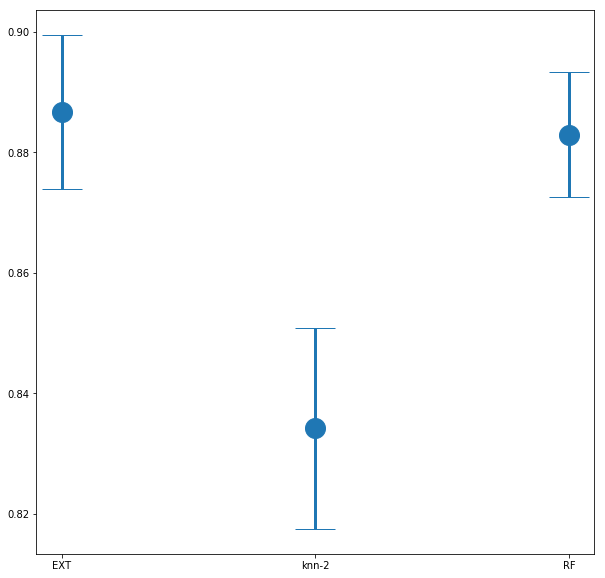

In [39]:
plt.figure(figsize=(10,10))
plt.errorbar(list(last_model_results_['model']), list(last_model_results_['cv_mean']),
             list(last_model_results_['cv_std']), fmt='o', lw=3,capsize=20,markersize=20)


## 1-On constate bien, d'après la variation des scores de cross validation des modèles que EXTRA-tree est le meilleur model. Malgré la variance de extra-tree qui est un peu plus grande que random forest.

Passons maintenant à la procédure des données de test en utilisant les meuilleures paramètres.

## TEST des modèles

In [40]:
train_scores=[]
test_scores=[]
models_scores=["knc","ext","rdf"]

In [41]:

knc = KNeighborsClassifier(n_neighbors=2)
knc.fit(X_train,y_train)
pred_train = knc.predict(X_train)
pred_test = knc.predict(X_test)
train_score, test_score = accuracy_score(y_train,pred_train),accuracy_score(y_test,pred_test)
print('KNeighborsClassifier')
print('---------->')
print("N_neighbors=",2,";Train score", train_score, "; Test score", test_score)
train_scores.append(train_score)
test_scores.append(test_score)



KNeighborsClassifier
---------->
N_neighbors= 2 ;Train score 0.9410612884276484 ; Test score 0.8254910918227502


In [42]:

ext = ExtraTreesClassifier(max_depth=150,n_estimators = 700, random_state = 10)
ext.fit(X_train,y_train)
pred_train = ext.predict(X_train)
pred_test = ext.predict(X_test)
train_score, test_score = accuracy_score(y_train,pred_train),accuracy_score(y_test,pred_test)
print('ExtraTreesClassifier')
print('---------->')
print("max_depth=",150,";Train score", train_score, "; Test score", test_score)
train_scores.append(train_score)
test_scores.append(test_score)

ExtraTreesClassifier
---------->
max_depth= 150 ;Train score 1.0 ; Test score 0.8830516217450891


In [43]:

rdf = RandomForestClassifier(max_depth=150,n_estimators = 700, random_state = 10)
rdf.fit(X_train,y_train)
pred_train = rdf.predict(X_train)
pred_test = rdf.predict(X_test)
train_score, test_score = accuracy_score(y_train,pred_train),accuracy_score(y_test,pred_test)
print('RandomForestClassifier')
print('---------->')
print("max_depth=",150,";Train score", train_score, "; Test score", test_score)
train_scores.append(train_score)
test_scores.append(test_score)

RandomForestClassifier
---------->
max_depth= 150 ;Train score 0.9998041903270022 ; Test score 0.8734582000913659


([<matplotlib.axis.XTick at 0x13591c550>,
 <a list of 3 Text xticklabel objects>)

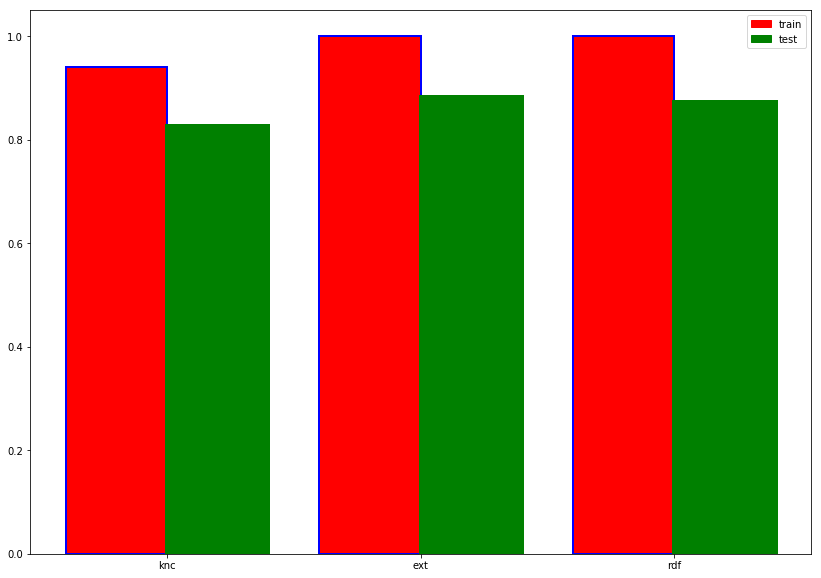

In [44]:
import matplotlib.patches as mpatches
plt.figure(figsize=(14,10))
barWidth = 0.4
y1 = train_scores
y2 = test_scores
r1 = range(len(y1))
r2 = [x + barWidth for x in r1]
train = mpatches.Patch(color='red', label='train')
test = mpatches.Patch(color='green', label='test')
plt.legend(handles=[train,test])

plt.bar(r1, y1, width = barWidth, color = ['red' for i in y1],
           edgecolor = ['blue' for i in y1], linewidth = 2)
plt.bar(r2, y2, width = barWidth, color = ['green' for i in y1],
           edgecolor = ['green' for i in y1], linewidth = 4)
plt.xticks([r + barWidth / 2 for r in range(len(y1))], models_scores)

## 2-On constate bien que les deux modèles randome-forest et extra-tree sont meilleurs que k_nearest_neighbors. Seulement ils sont de la même grandeur. Ils ont presque le même score d'entrainement et presque le même score de test avec un petit avantage pour extra-tree.



## Donc d'aprés (1et 2) on conclu que Extra-tree est le meilleur modèle.

On verifie le nombre de classe traiter et le nombre de motifs

In [45]:
print("The number of classes (single output problem) for each output (multi-output problem):",ext.n_classes_)
print('The number of features when fit is performed:',ext.n_features_)
print('Total nombre de classes',len(ext.classes_))

The number of classes (single output problem) for each output (multi-output problem): 301
The number of features when fit is performed: 8876
Total nombre de classes 301


Tous les motifs et les classes sont bien traiter.

Maintenant on évalue notre résultats.

In [46]:

ext = ExtraTreesClassifier(max_depth=150,n_estimators = 700, random_state = 10)
ext.fit(X_train,y_train)
pred_train = ext.predict(X_train)
pred_test = ext.predict(X_test)
train_score, test_score = accuracy_score(y_train,pred_train),accuracy_score(y_test,pred_test)
print('ExtraTreesClassifier')
print('---------->')
print("max_depth=",150,";Train score", train_score, "; Test score", test_score)
train_scores.append(train_score)
test_scores.append(test_score)

ExtraTreesClassifier
---------->
max_depth= 150 ;Train score 1.0 ; Test score 0.8830516217450891


# évaluation des résultats

Pour l'évaluation des résultats se fait avec les mésures quivantes:

La precision :La précision est le rapport tp / (tp + fp) où tp est le nombre de vrais positifs et fp le nombre de faux positifs. La précision est intuitivement la capacité du classificateur à ne pas étiqueter comme positif un échantillon négatif.


Le rappel :Le rappel est le rapport tp / (tp + fn) où tp est le nombre de vrais positifs et fn le nombre de faux négatifs. Le rappel est intuitivement la capacité du classificateur à trouver tous les échantillons positifs.


Le score F-bêta: Le score F-bêta peut être interprété comme une moyenne harmonique pondérée de la précision et du rappel, où un score F-bêta atteint sa meilleure valeur à 1 et son pire score à 0.

Les poids des scores F-bêta rappellent plus que la précision par un facteur bêta. beta == 1.0 signifie que le rappel et la précision sont tout aussi importants.

le bêta est égale à 2 ici.


In [47]:
from sklearn.metrics import classification_report
report = classification_report(y_test, pred_test,output_dict=True)
report_text=classification_report(y_test, pred_test)
print(report_text)

              precision    recall  f1-score   support

           0       1.00      0.86      0.92         7
           1       0.75      1.00      0.86         6
           2       0.67      1.00      0.80         4
           3       0.88      0.88      0.88         8
           4       0.80      1.00      0.89         8
           5       0.86      0.86      0.86         7
           6       1.00      1.00      1.00        10
           7       0.86      0.75      0.80         8
           8       1.00      1.00      1.00         4
           9       0.67      0.86      0.75         7
          10       1.00      0.80      0.89        10
          11       1.00      0.40      0.57        10
          12       0.80      0.67      0.73         6
          13       1.00      1.00      1.00         6
          14       0.90      1.00      0.95         9
          15       1.00      0.86      0.92         7
          16       0.78      1.00      0.88         7
          17       0.70    

Pour bien illustrer les resultats, On va créer un heatmap qui colorise les scores.

Celà va nous facilité la tache pour detecter les classes avec un score faible

Ces score correspondent à la couleur noire

# Résultats

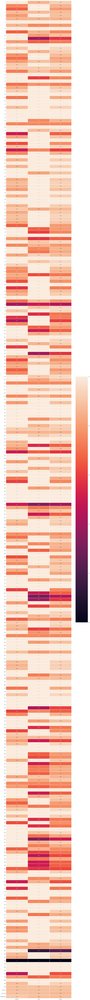

In [48]:
fig, ax = plt.subplots(figsize=(20,250))       

sns.heatmap(pd.DataFrame(report).iloc[:-1, :].T,linewidths=.5,ax=ax, annot=True)


Puisqu'on a régler le problème des famille Im balancées on a bel et bien trouvé de bons scores pour la plupart des familles. Seules les deux familles 292 et 289 contiennent  de mauvais résultats.

D'autres familles ont des scores imblancés entre la précision et le recall comme 117 184 et 255. Je pense que cela est due au manque de motifs caractérisant ces familles, ou bien à la partie d'entrainement du modèle qui n'a pas eu assez de données pour ces familles.

On peut régler le problème en utilisant d'autres méthodes de cross_validation. Cependant  puisque les résultats est assez bon dans l’ensemble, On va le garder.

# Motifs importance

On va présenter l'importance des motifs pour cette classification en utilisant extra-tree classifier.

In [91]:
motifs=data_motif.columns
motifs_importance=pd.DataFrame(ext.feature_importances_,index=motifs,columns=['motifs_importance'])
motifs_importance.sort_values(by=['motifs_importance'])

,motifs_importance
CGCAAGCG,8.371186e-07
CGCCCGGA,8.436999e-07
GGACGACC,1.003299e-06
CACCACACC,1.025999e-06
GCGCGGGCG,1.036936e-06
...,...
AACACAAAC,2.023848e-03
GACGCCCC,2.103213e-03
GGCAAAGC,2.122471e-03
GCACACCA,2.350602e-03


Les statistiques des importance selon chaque motifs.

In [68]:
motifs_importance.describe()

,motifs_importance
count,8.876000e+03
mean,1.126634e-04
std,1.920452e-04
min,8.371186e-07
25%,1.643014e-05
50%,4.467111e-05
75%,1.211235e-04
max,2.369849e-03


On visualise cette importance pour voir clairement sa variation selon les motif representer par leurs index.

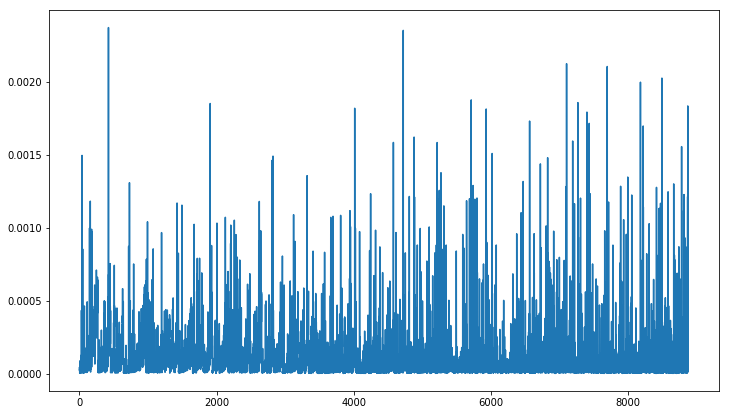

In [128]:
plt.figure(figsize=(12,7))

plt.plot(motifs_importance.values)

On constate bien que l'importance varie selon les motifs.

La plus part des motifs ont une importance presque négligeable devant d'autres.

Pour régler ce problème, on va procéder à la sélection des motifs qui représentent une importance élevée.

On va trier ces importances pour voir la valeur du seuil qu'on va prendre.


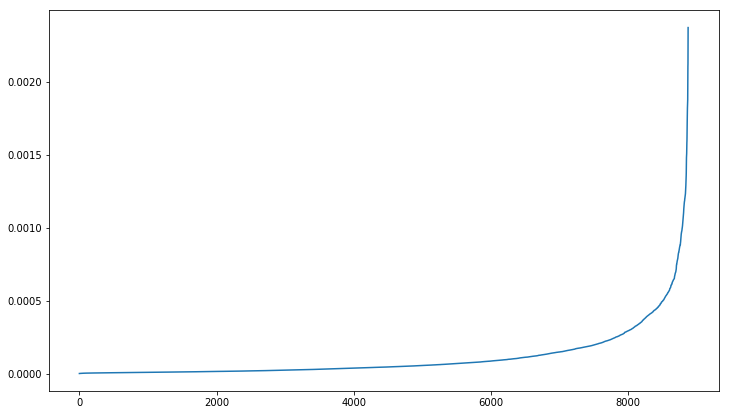

In [127]:
plt.figure(figsize=(12,7))
plot_importance=motifs_importance.sort_values(by=['motifs_importance'])


plt.plot(plot_importance.values)

La valeur du seuil pris, correspond au virage '0.0002' : C'est à dire là où la courbe commence à augmenter de façon exponentielle.


On va visualiser les statistiques avec la loi normale et le boxplot pour être sûr de notre seuil choisi.


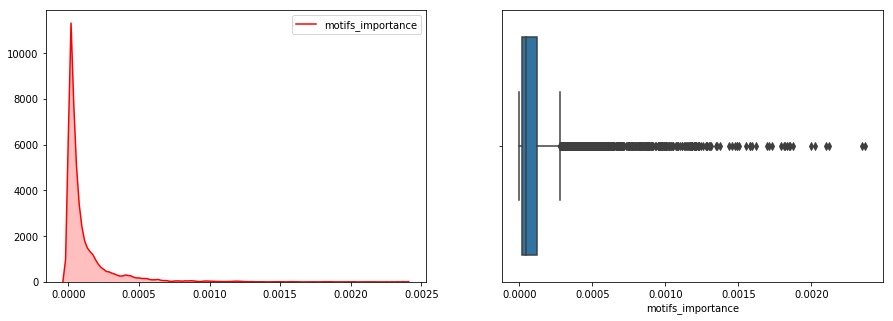

In [69]:
fig,axes=plt.subplots(1,2,figsize=(15,5))
sns.kdeplot(motifs_importance['motifs_importance'], shade=True, color="r",ax = axes[0])
sns.boxplot(x="motifs_importance", data = motifs_importance,ax = axes[1])


Avant d'extraire les motifs importants, on essayera de voir l'information au niveau de la longueur des motifs. : si la longueur de la chaine des motifs est corrélée avec son importance.


In [135]:
motifs_importance['len_motif']=motifs_importance.index.str.len()
motifs_importance


,motifs_importance,len_motif
ACGAAAGC,0.000024,8
ACGAGGCA,0.000025,8
CAAACCGA,0.000044,8
CAAGCCGG,0.000015,8
AGACCACG,0.000014,8
...,...,...
CAACAGGA,0.000076,8
ACCGGGCC,0.000016,8
CCGAACAC,0.000124,8
GCACGCGA,0.000260,8


Text(0.5,1,'importance de motif par sa longueur de chaine')

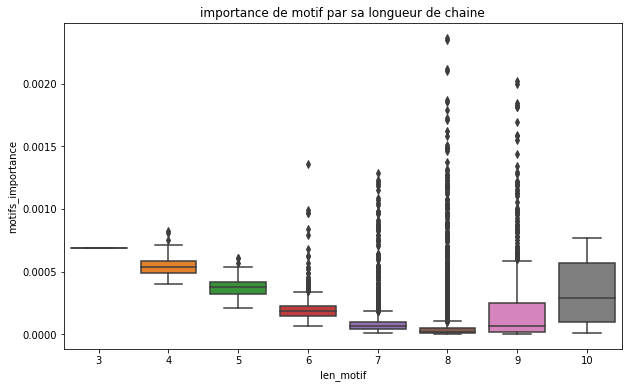

In [133]:
plt.figure(figsize = (10, 6))
sns.boxplot(x = 'len_motif', y = 'motifs_importance', data = motifs_importance);
plt.title('importance de motif par sa longueur de chaine')

On constate bien que les motifs de petites tailles ont une grande importance. Cela semble évident.

De même les motifs de grandes tailles ont de l’importance.

D’où on peut conclure que les motifs de grandes tailles sont spécifiques à chaque classe et c'est eux qui déterminent la classification.

Ainsi que  les motifs de petites tailles, chaque classe peut posséder une fréquence unique pour chaque motif de petite taille (chaine). Ce qui peut aussi contribuer à la classification.


## extraction des motifs important

On fait l'extraction des motifs à l'aide du seuil déterminer avant.

In [93]:
Best_motifs = motifs_importance[motifs_importance["motifs_importance"] >0.0002]
index_best_features=Best_motifs.index
data_motif_reducted=data_motif[index_best_features]


In [ ]:
index_best_features
f=open('motifs_importance.txt','w')
for ele in index_best_features:
    f.write(ele+'\n')

f.close()

On refait l'entrainement et l'évaluation des modèles uniquement avec ces motifs importants.

In [96]:
Xn_train, Xn_test, yn_train, yn_test = train_test_split(data_motif_reducted, data_classe, test_size=0.3)


In [104]:
train_scoress=[]
test_scoress=[]
ext = ExtraTreesClassifier(max_depth=150,n_estimators = 700, random_state = 10)
ext.fit(Xn_train,yn_train)
pred_train = ext.predict(Xn_train)
pred_test = ext.predict(Xn_test)
train_score, test_score = accuracy_score(yn_train,pred_train),accuracy_score(yn_test,pred_test)
print('ExtraTreesClassifier')
print('---------->')
print("max_depth=",150,";Train score", train_score, "; Test score", test_score)
train_scoress.append(train_score)
test_scoress.append(test_score)

ExtraTreesClassifier
---------->
max_depth= 150 ;Train score 0.9998041903270022 ; Test score 0.8679762448606669


In [105]:

rdf = RandomForestClassifier(max_depth=150,n_estimators = 700, random_state = 10)
rdf.fit(Xn_train,yn_train)
pred_train = rdf.predict(Xn_train)
pred_test = rdf.predict(Xn_test)
train_score, test_score = accuracy_score(yn_train,pred_train),accuracy_score(yn_test,pred_test)
print('RandomForestClassifier')
print('---------->')
print("max_depth=",150,";Train score", train_score, "; Test score", test_score)
train_scoress.append(train_score)
test_scoress.append(test_score)

RandomForestClassifier
---------->
max_depth= 150 ;Train score 0.9996083806540043 ; Test score 0.8487894015532207


In [106]:

knc = KNeighborsClassifier(n_neighbors=2)
knc.fit(Xn_train,yn_train)
pred_train = knc.predict(Xn_train)
pred_test = knc.predict(Xn_test)
train_score, test_score = accuracy_score(yn_train,pred_train),accuracy_score(yn_test,pred_test)
print('KNeighborsClassifier')
print('---------->')
print("N_neighbors=",2,";Train score", train_score, "; Test score", test_score)
train_scoress.append(train_score)
test_scoress.append(test_score)



KNeighborsClassifier
---------->
N_neighbors= 2 ;Train score 0.9410612884276484 ; Test score 0.857012334399269


([<matplotlib.axis.XTick at 0x14782e2e8>,
 <a list of 3 Text xticklabel objects>)

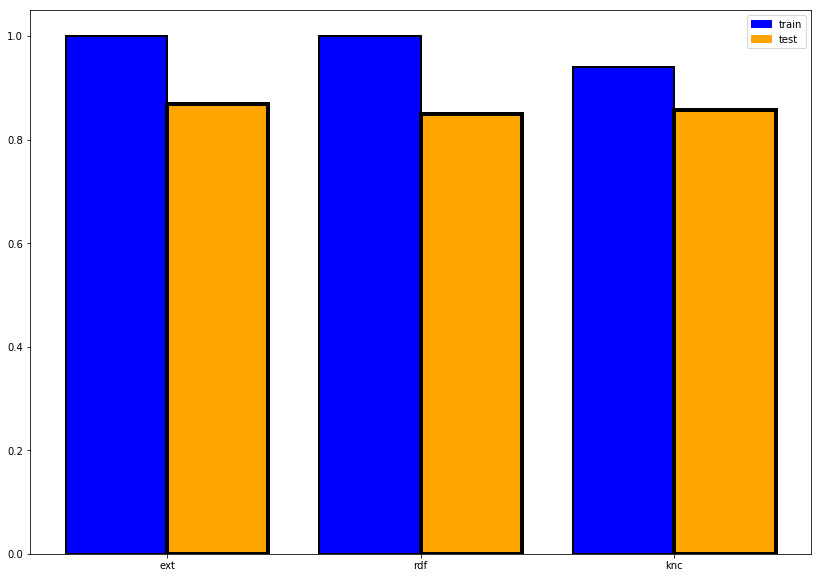

In [108]:
models_scores=["ext","rdf","knc"]
import matplotlib.patches as mpatches
plt.figure(figsize=(14,10))
barWidth = 0.4
y1 = train_scoress
y2 = test_scoress
r1 = range(len(y1))
r2 = [x + barWidth for x in r1]
train = mpatches.Patch(color='blue', label='train')
test = mpatches.Patch(color='orange', label='test')
plt.legend(handles=[train,test])

plt.bar(r1, y1, width = barWidth, color = ['blue' for i in y1],
           edgecolor = ['black' for i in y1], linewidth = 2)
plt.bar(r2, y2, width = barWidth, color = ['orange' for i in y1],
           edgecolor = ['black' for i in y1], linewidth = 4)
plt.xticks([r + barWidth / 2 for r in range(len(y1))], models_scores)

On constate qu'on a eu les mêmes résultats qu'avant. Même avec une réduction de presque 80% de motifs.
## Evaluation des résultats

In [110]:
from sklearn.metrics import classification_report
report_new = classification_report(yn_test, pred_test,output_dict=True)
report_text_new=classification_report(yn_test, pred_test)
print(report_text_new)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         9
           1       0.75      0.50      0.60         6
           2       0.70      1.00      0.82         7
           3       0.70      1.00      0.82         7
           4       0.89      1.00      0.94         8
           5       0.67      0.80      0.73         5
           6       1.00      1.00      1.00         3
           7       0.67      1.00      0.80         6
           8       1.00      0.86      0.92         7
           9       0.83      1.00      0.91        10
          10       1.00      0.67      0.80         9
          11       0.29      1.00      0.44         6
          12       0.67      1.00      0.80         4
          13       1.00      1.00      1.00        12
          14       1.00      0.67      0.80         9
          15       0.90      0.90      0.90        10
          16       0.80      0.57      0.67         7
          17       0.77    

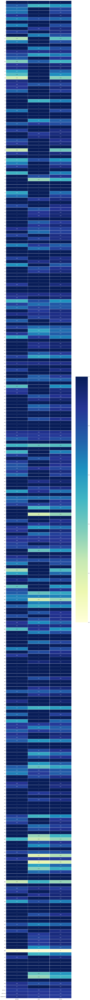

In [113]:
fig, ax = plt.subplots(figsize=(20,250))       

sns.heatmap(pd.DataFrame(report_new).iloc[:-1, :].T,linewidths=.5,cmap="YlGnBu",ax=ax, annot=True)


ces résultats prouvent que l'extraction des motifs importants peuvent aider à une amélioration du score.

La seule classe avec 0 score est la classe 289, la même classe trouvée avant dans la première visualisation.

On a des score imbalancés pour d’autres classes mais moins que l'évaluation précédente.

## Motifs importance n2

On visualise pour la deuxième fois l'importance des motifs.

In [116]:
motifs_reducted=data_motif_reducted.columns
motifs_reducted_importance=pd.DataFrame(ext.feature_importances_,index=motifs_reducted,columns=['motifs_importance'])
motifs_reducted_importance.sort_values(by=['motifs_importance'])

,motifs_importance
GGAACGCG,0.000018
AGGGCAGAC,0.000040
ACAGCAAC,0.000051
CACAGGGCA,0.000054
GCGACAAA,0.000055
...,...
CCACAAAGG,0.003160
CGGGCCAC,0.003163
CCCAGAACC,0.003430
GAACAGGA,0.003859


In [119]:
motifs_reducted_importance.describe()

,motifs_importance
count,1350.000000
mean,0.000741
std,0.000509
min,0.000018
25%,0.000427
50%,0.000623
75%,0.000909
max,0.004237


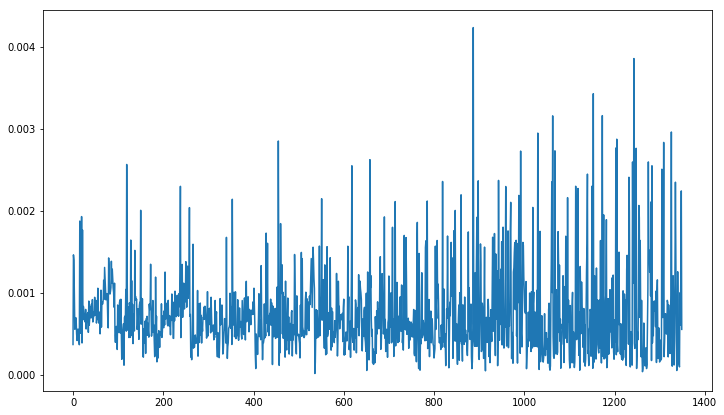

In [126]:
plt.figure(figsize=(12,7))

plt.plot(motifs_reducted_importance.values)

On constate que la variation d'importance existe encore mais au moins on a évité le problème des motifs négligeables.

On va essayer de faire une dernière extraction des motifs.

# Motifs extraction n2

En utilisant la même approche qu'avant, on procède à l'extraction.

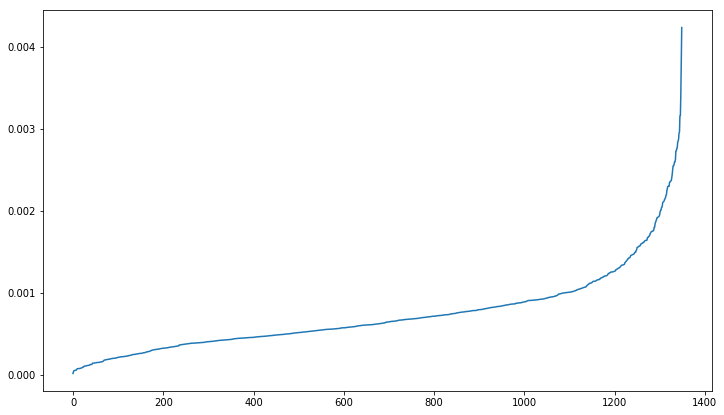

In [125]:
plt.figure(figsize=(12,7))
plot_reducted_importance=motifs_reducted_importance.sort_values(by=['motifs_importance'])


plt.plot(plot_reducted_importance.values)

Le seuil choisi correspond à 0.0012

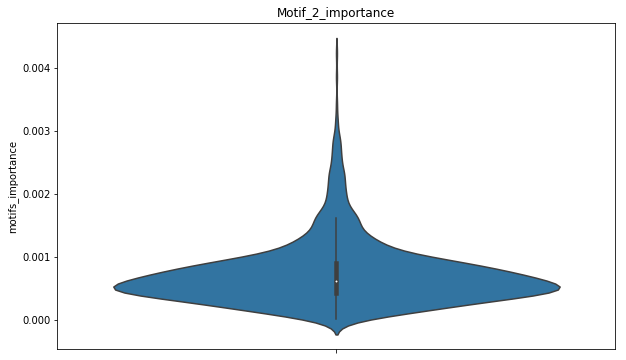

In [124]:
plt.figure(figsize = (10, 6))
sns.violinplot( y = 'motifs_importance', data = motifs_reducted_importance);
plt.title('Motif_2_importance');

In [134]:
motifs_reducted_importance['len_motif']=motifs_reducted_importance.index.str.len()
motifs_reducted_importance

,motifs_importance,len_motif
GGAAACCG,0.000371,8
GACAAGAG,0.001465,8
ACGGCGA,0.001400,7
GCAAACCG,0.000937,8
GACAGACC,0.000557,8
...,...,...
GCAACGGCA,0.001001,9
AAGCAACG,0.000610,8
GGAAAGCCA,0.001238,9
CCAAAGGGA,0.002244,9


Text(0.5,1,'2-importance de motif par sa longueur de chaine')

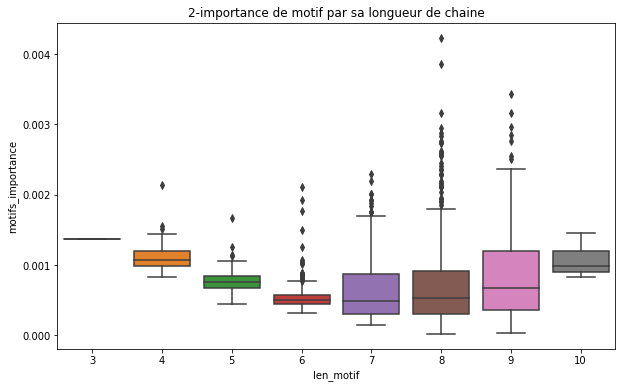

In [136]:
plt.figure(figsize = (10, 6))
sns.boxplot(x = 'len_motif', y = 'motifs_importance', data = motifs_reducted_importance);
plt.title('2-importance de motif par sa longueur de chaine')

# Extraction des motifs!

# Nouvelle base de données!

In [138]:
best_motifs_reduced = motifs_reducted_importance[motifs_reducted_importance["motifs_importance"] >0.0012]
index_best_features_reduced=best_motifs_reduced.index
data_best_reducted=data_motif[index_best_features_reduced]
data_best_reducted

,GACAAGAG,ACGGCGA,CCGGAAC,CGGAAC,AAGAGC,CGCC,ACCC,CCCG,GGGC,GGGG,...,AGGCCAAGG,ACCCCAAG,AGGCAAAAC,ACGCCCCC,CAGAGAAGCC,ACAGAGAAG,ACAGAGAAGC,AGAAGCACA,GGAAAGCCA,CCAAAGGGA
0,0,0,1,1,3,3,7,3,4,8,...,0,0,0,0,0,0,0,0,0,0
1,0,0,1,1,3,3,7,3,4,8,...,0,0,0,0,0,0,0,0,0,0
2,0,0,1,1,0,2,7,3,4,7,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1,1,0,2,8,3,7,8,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,3,3,8,3,6,8,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7291,0,0,0,0,0,1,1,3,4,2,...,0,0,0,0,0,0,0,0,0,0
7292,0,0,0,0,0,1,1,2,6,3,...,0,0,0,0,0,0,0,0,0,0
7293,0,0,0,0,0,1,1,2,6,3,...,0,0,0,0,0,0,0,0,0,0
7294,0,0,0,0,0,2,1,4,5,2,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
index_best_features_reduced
f=open('motifs_importance_n2.txt','w')
for ele in index_best_features_reduced:
    f.write(ele+'\n')
f.close()


data_best_reducted.to_csv('data_motifs_extraction')



# Entrainnement!

In [141]:
Xnn_train, Xnn_test, ynn_train, ynn_test = train_test_split(data_best_reducted, data_classe, test_size=0.3)


In [142]:

ext = ExtraTreesClassifier(max_depth=150,n_estimators = 700, random_state = 10)
ext.fit(Xnn_train,ynn_train)
pred_train = ext.predict(Xnn_train)
pred_test = ext.predict(Xnn_test)
train_score, test_score = accuracy_score(ynn_train,pred_train),accuracy_score(ynn_test,pred_test)
print('ExtraTreesClassifier')
print('---------->')
print("max_depth=",150,";Train score", train_score, "; Test score", test_score)


ExtraTreesClassifier
---------->
max_depth= 150 ;Train score 0.9996083806540043 ; Test score 0.836455002284148


## On a trouvé un bon score malgré le nombre de motifs restant (174)!

# visualisation de l'arbre de extra-tree

In [143]:
estimator_ = ext.estimators_[5]
estimator_

ExtraTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                    max_depth=150, max_features='auto', max_leaf_nodes=None,
                    min_impurity_decrease=0.0, min_impurity_split=None,
                    min_samples_leaf=1, min_samples_split=2,
                    min_weight_fraction_leaf=0.0, random_state=1902734705,
                    splitter='random')

In [153]:
from sklearn.tree import export_graphviz
classe_num=[str(i).zfill(2) for i in range(0,301)]
export_graphviz(estimator_, out_file='tree_limited.dot', feature_names = data_best_reducted.columns,
                class_names = classe_num,
                rounded = True, proportion = False, precision = 2, filled = True)

In [154]:
!dot -Tpng tree_limited.dot -o tree_limited.png


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.103436 to fit


# Visualisation

In [155]:
from IPython.display import Image
Image(filename = 'tree_limited.png')

L'arbre est de taille énorme à cause des paramètres choisi.

### On va essayer de réduire le nombre de n_estimators et max_depth et on visualise le résultats

In [ ]:
from IPython.display import Image
Image(filename = 'tre_limited.png')

In [169]:

ext = ExtraTreesClassifier(max_depth=100,n_estimators = 100, random_state = 10)
ext.fit(Xnn_train,ynn_train)
pred_train = ext.predict(Xnn_train)
pred_test = ext.predict(Xnn_test)
train_score, test_score = accuracy_score(ynn_train,pred_train),accuracy_score(ynn_test,pred_test)
print('ExtraTreesClassifier')
print('---------->')
print("max_depth=",150,";Train score", train_score, "; Test score", test_score)


ExtraTreesClassifier
---------->
max_depth= 150 ;Train score 0.9996083806540043 ; Test score 0.7811786203746003


la réduction des paramètres reduit aussi le score de test.

In [170]:
estimator = ext.estimators_[5]
estimator

ExtraTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                    max_depth=100, max_features='auto', max_leaf_nodes=None,
                    min_impurity_decrease=0.0, min_impurity_split=None,
                    min_samples_leaf=1, min_samples_split=2,
                    min_weight_fraction_leaf=0.0, random_state=1902734705,
                    splitter='random')

In [171]:
from sklearn.tree import export_graphviz
classe_num=[str(i).zfill(2) for i in range(0,301)]
export_graphviz(estimator, out_file='tree_RNA.dot', feature_names = data_best_reducted.columns,
                class_names = classe_num,
                rounded = True, proportion = False, precision = 2, filled = True)

In [172]:
!dot -Tpng tree_RNA.dot -o tree_RNA.png


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.312647 to fit


# Visualisation

### Malheureusement malgré la réduction du nombre de paramètres, on n’a pas pu visualiser l'arbre correctement.

In [173]:
Image(filename = 'tree_RNA.png')

## Visualisation d'une partie d'arbre

In [195]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display                               
from ipywidgets import interactive
start_time = time.time()



def plot_tree(crit, split, depth, min_split, min_leaf=0.1):
    estimator = DecisionTreeClassifier( random_state =10
      , criterion = crit
      , splitter = split
      , max_depth = depth
      , min_samples_split=min_split
      , min_samples_leaf=min_leaf)
    estimator.fit(Xnn_train, ynn_train)
    graph = Source(tree.export_graphviz(estimator
      , out_file=None
      , class_names=classe_num
      , feature_names = data_best_reducted.columns
      , filled = True))
   
    display(SVG(graph.pipe(format='svg')))
    return estimator
inter=interactive(plot_tree 
   , crit = ["entropy","gini"]
   , split = ["best", "random"]
   , depth=[100,50,150]
   , min_split=(0.00001,0.1,1)
   , min_leaf=(0.00001,0.1,0.5))
print("Temps d execution : %s secondes ---" % (time.time() - start_time))
display(inter)

Temps d execution : 0.04755902290344238 secondes ---


interactive(children=(Dropdown(description='crit', options=('entropy', 'gini'), value='entropy'), Dropdown(des…

In [196]:
!dot -Tpng last_tree_.dot -o last_tree_.png


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0644812 to fit


# Même une visualisation avec 'décision-tree' semble impossible.

# Mais quand même on peut voir le schéma de cet arbre.


# la forme totale de l'arbre à voir dans le fichier joint.


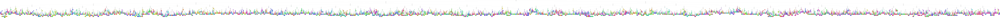

In [197]:
Image(filename = 'last_tree_.png')

# Application sur la dataset global après réduction totale des motifs


# Test sur 3016 familles avec les motifs qu'on a obtenus


# LAST TEST

### Importation de la base de données


In [4]:
data_arn_all_famille = pd.read_csv("data/nbf-all_minLm-2_maxLm-05.csv") 

### correction des incoherences

In [5]:
data_arn_all_famille=data_arn_all_famille.rename(columns={"familyId": "Classe"})    
data_arn_all_famille=data_arn_all_famille.drop(['Unnamed: 363','seqIdInFam','index'], axis=1)
#On change le type to int
data_arn_all_famille= data_arn_all_famille.astype(int)
data_arn_all_famille_copy=data_arn_all_famille.copy()

In [6]:
data_arn_all_famille_classe=data_arn_all_famille["Classe"]
data_arn_all_famille_motif=data_arn_all_famille.drop(['Classe'], axis=1)
X=np.asarray(data_arn_all_famille_motif)
y=np.asarray(data_arn_all_famille_classe)

## taille de la base de données

In [7]:
freq_dd=data_arn_all_famille.Classe.value_counts().gt(30)
data_alll=data_arn_all_famille.loc[data_arn_all_famille.Classe.isin(freq_dd[freq_dd].index)]
data_alll.shape

(49346, 361)

# APPLICATION DU MODÈLE

## MALHEUREUSEMENT ON N’a PAS PU APPLIQUER LE MEILLEUR MODÈLE OBTENU À CAUSE DE LA TAILLE ÉNORME DE LA BASE  ET LES PARAMETRES DU MODÈLE.


### L’utilisation d’extra tree peut prendre jusqu'à 3h pour s'exécuter dans un bon environnement.



## On a utilisé K-NEIGHBORS à sa place puisqu'il est très rapide et aussi parce qu’il donne un bon résultat .



In [8]:
data_alll_fam=data_alll["Classe"]
data_alll_cla=data_alll.drop(['Classe'], axis=1)

KNN: 0.892697 (0.004159)


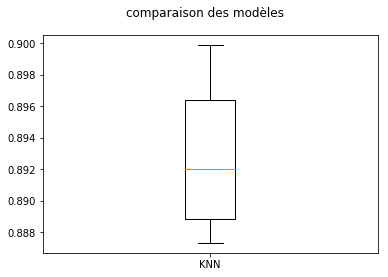

Temps d'execution : 350.9658308029175 secondes ---


In [24]:
start_time = time.time()

classif = []
#classif.append(('ETR',ExtraTreesClassifier(n_estimators=10, criterion='gini', max_depth=150)))need alot of time but give better result
classif.append(('KNN', KNeighborsClassifier(n_neighbors=2)))
#classif.append(('NB', GaussianNB()))
#classif.append(('NR',MLPClassifier(alpha=0.0001))) need alot of time but give best result
#evaluer chaque modèle
resulats = []
noms = []
scoring = 'accuracy'
for name, model in classif:
    kfold = model_selection.KFold(n_splits=10,shuffle=True, random_state=10)
    cross_val_results = model_selection.cross_val_score(model, data_alll_cla, data_alll_fam, cv=kfold, scoring=scoring)
    resulats.append(cross_val_results)
    noms.append(name)
    print("%s: %f (%f)" % (name, cross_val_results.mean(), cross_val_results.std()))
# boxplot algorithme comparaison
fig = plt.figure()
fig.suptitle('comparaison des modèles')
ax = fig.add_subplot(111)
plt.boxplot(resulats)
ax.set_xticklabels(noms)
plt.show()
print("Temps d'execution : %s secondes ---" % (time.time() - start_time))


## On constate qu'on a obtenu un bon résultat.


## La variation est un peu significative donc on visualise les scores obtenus.


In [25]:
inter=[1,2,3,4,5,6,7,8,9,10]
cross_val_results
d = {'iteration':inter , 'score': cross_val_results}
data_resultss=pd.DataFrame(data=d)

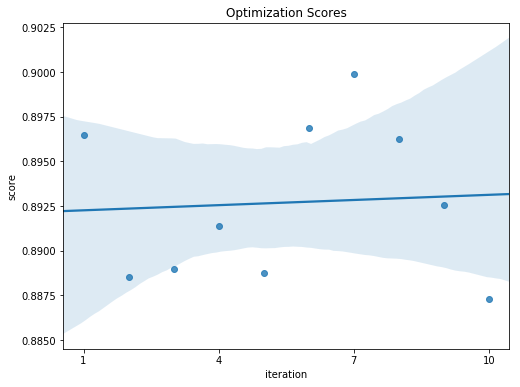

In [26]:
plt.figure(figsize = (8, 6))
sns.regplot('iteration', 'score', data = data_resultss);
plt.title("Optimization Scores");
plt.xticks(list(range(1, data_resultss['iteration'].max() + 1, 3)));

## Donc avec une cross validation, on obtient un score moyen de 0.89 ce qui prouve qu'on a réussi à avoir une bonne classification.

In [30]:
start_time = time.time()

from sklearn.model_selection import KFold


Xlast_train, Xlast_test, ylast_train, ylast_test = train_test_split(data_alll_cla, data_alll_fam, test_size=0.3)

#exxt=ExtraTreesClassifier(max_depth=150,n_estimators = 700, random_state = 10)give better result but need alot of time
knc = KNeighborsClassifier(n_neighbors=2)

  

knc.fit(Xlast_train, ylast_train)
scoret=knc.score(Xlast_train, ylast_train)
print("Score d'entrainement final: ",scoret)
scoretest=knc.score(Xlast_test, ylast_test)
print("Score de test final: ",scoretest)
print("Temps d'execution : %s secondes ---" % (time.time() - start_time))
 

Score d'entrainement final:  0.9528400208441897
Score de test final:  0.8802350716022697
Temps d'execution : 260.90861535072327 secondes ---


## Un score de test de 0.88 aussi semble parfait.

# Prédiction

In [36]:

knc = KNeighborsClassifier(n_neighbors=2)
knc.fit(Xlast_train,ylast_train)
pred_train = knc.predict(Xlast_train)
pred_test = knc.predict(Xlast_test)
train_score, test_score = accuracy_score(ylast_train,pred_train),accuracy_score(ylast_test,pred_test)
print('KNeighborsClassifier')
print('---------->')
print("N_neighbors=",2,"; Last Train score", train_score, ";Last Test score", test_score)




KNeighborsClassifier
---------->
N_neighbors= 2 ; Last Train score 0.9528400208441897 ;Last Test score 0.8802350716022697


# Évaluation des resultats des 3016 familles

## PRECISION

## RECALL

## F-MESURE

In [37]:
from sklearn.metrics import classification_report
report_last = classification_report(ylast_test, pred_test,output_dict=True)
report_text_last=classification_report(ylast_test, pred_test)
print(report_text_last)

              precision    recall  f1-score   support

           0       0.85      0.88      0.87        69
           6       0.85      0.94      0.89        18
          23       0.62      1.00      0.77        10
          28       1.00      1.00      1.00        19
          33       0.74      1.00      0.85        14
          38       0.92      1.00      0.96        36
          42       0.79      0.84      0.82        32
          43       0.83      0.91      0.87        11
          44       0.82      0.96      0.89        28
          67       0.72      1.00      0.84        34
          68       0.86      0.97      0.91       137
          86       0.80      1.00      0.89        65
         105       0.77      1.00      0.87        20
         108       0.89      0.89      0.89        19
         109       0.90      1.00      0.95         9
         120       0.95      1.00      0.97        18
         124       0.65      0.65      0.65        17
         131       0.76    

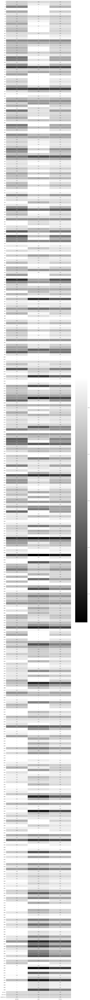

In [50]:
fig, ax = plt.subplots(figsize=(20,250))       

sns.heatmap(pd.DataFrame(report_last).iloc[:-1, :].T,linewidths=.5,cmap="gray",ax=ax, annot=True)


# A cause du nombre de famille on n’a pas pu afficher tout.



# F1-score=0.88


# On a eu un résultats parfait.

# On aurait pu arriver à de meilleurs résultats, seulement le manque du matériels ainsi que la crise actuelle nous  en ont empêchés.





# FIN